# Text Recognition for Accessibility

### I320D Applied ML - Project Proposal & Planning
### Group: Data Damsels - ***Sophia Kurz, Alyssa Perez, Pranutha Punkula, Naila Hajiyeva***


The **goal** of our project is to promote accessibility for people with visual impairments by identifying text from a picture and reading it out. This project is important because improving accessibility provides equal access to people with disabilities. This ensures that all people can perceive, understand, and navigate the world equally and with assistive technology when needed.

The **dataset** we will be using is the Kaggle Text Extraction from Images Dataset.

Our **proposed method** for building a product is using a Neural Network to identify text from images using Natural Language Processing.

## Dataset

TextOCR requires models to perform text-recognition on arbitrary shaped scene-text present on natural images. TextOCR provides ~1M high quality word annotations on TextVQA images allowing application of end-to-end reasoning on downstream tasks such as visual question answering or image captioning.

CC0: Public Domain

In [1]:
#Importing Libraries 

#!pip install keras-ocr -q
import keras_ocr
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import csv

#Import for interacting with files and for loops

from glob import glob
from tqdm.notebook import tqdm

#Imports for visualizations and viewing images

import matplotlib.pyplot as plt
from PIL import Image

plt.style.use('ggplot')

#Reading annot.csv into a dataframe

annot_df = pd.read_csv("annot.csv")
annot_df.head()

#Sampling 1000 rows using df.sample() method
#Saving it to a CSV named annot_downsized.csv

annot_downsized = annot_df.sample(n=1000)
annot_downsized.info()
annot_downsized.to_csv("annot_downsized.csv")

2023-04-25 22:05:00.838059: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 588629 to 824834
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   1000 non-null   int64  
 1   id           1000 non-null   object 
 2   image_id     1000 non-null   object 
 3   bbox         1000 non-null   object 
 4   utf8_string  1000 non-null   object 
 5   points       1000 non-null   object 
 6   area         1000 non-null   float64
dtypes: float64(1), int64(1), object(5)
memory usage: 62.5+ KB


In [2]:
#Read annot_downsized.csv again and img.csv into two dataframes. 
#Merge and save the intersection of the dataframes based on image_id column. 
#REMEMBER, this will retain all columns from annot.csv and img.csv. 

image_df = pd.read_csv("img.csv")
annot_df = pd.read_csv("annot_downsized.csv")

merged_df = pd.merge(image_df, annot_df, on='id', how='inner')

merged_df.head()

,Unnamed: 0_x,id,width,height,set,file_name,Unnamed: 0.1,Unnamed: 0_y,image_id,bbox,utf8_string,points,area


In [3]:
#Download all images (jpg_files) from train_val_images into a directory. 
#You may wish to delete all the image files that are not required.

from PIL import Image
import glob
image_list = []
for filename in glob.glob('../Final_Project/train_val_images/train_images/*.jpg'):
    im=Image.open(filename)
    image_list.append(im)


#plt.imread(plt.imread(image_list[2]))

## Plotting Test Images

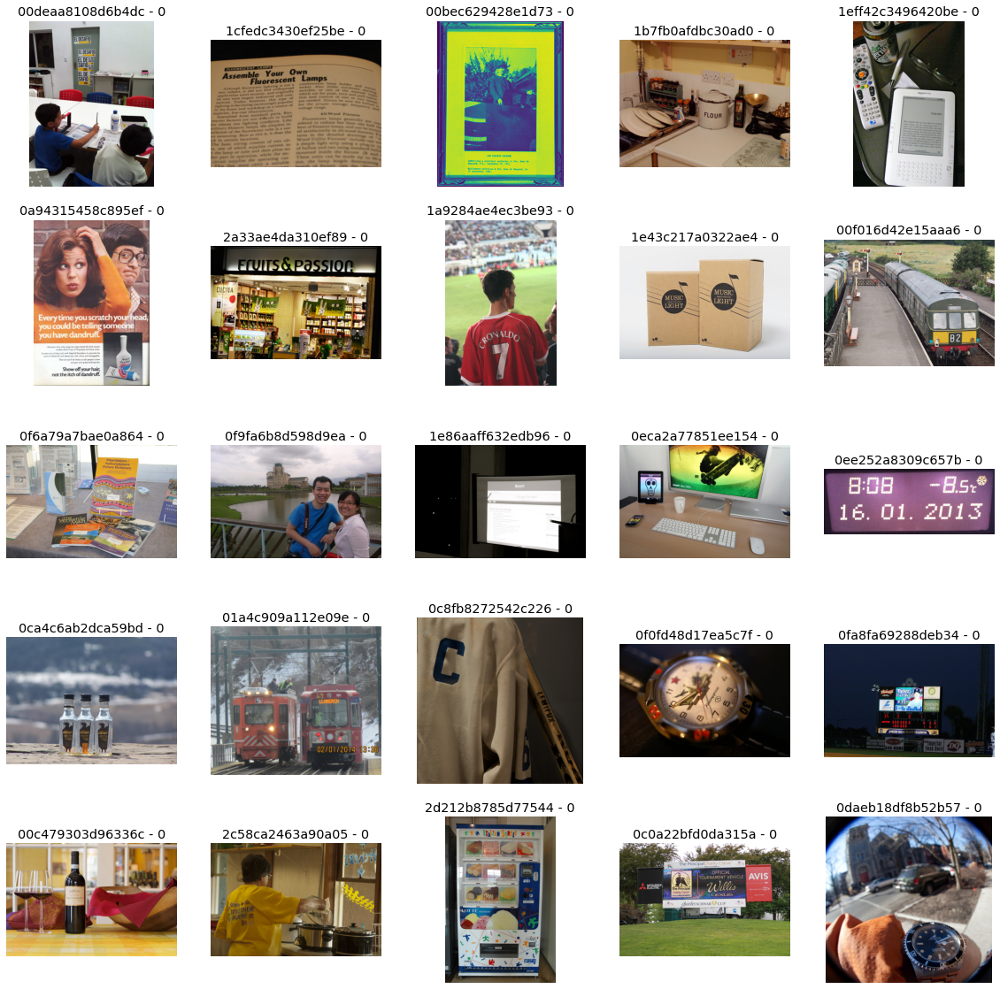

In [4]:
#Plotting example images

img_fns = glob.glob('../Final_Project/train_val_images/train_images/*')

fig, axs = plt.subplots(5, 5, figsize=(20, 20))
axs = axs.flatten()
for i in range(25):
    axs[i].imshow(plt.imread(img_fns[i]))
    axs[i].axis('off')
    image_id = img_fns[i].split('/')[-1].rstrip('.jpg')
    n_annot = len(annot_df.query('image_id == @image_id'))
    axs[i].set_title(f'{image_id} - {n_annot}')
plt.show()


## Extracting Text from Images using Keras OCR

Looking for /Users/pranuthapunukula/.keras-ocr/craft_mlt_25k.h5


2023-04-25 22:05:16.826441: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Looking for /Users/pranuthapunukula/.keras-ocr/crnn_kurapan.h5
6/6 [==============================] - 35s 6s/step


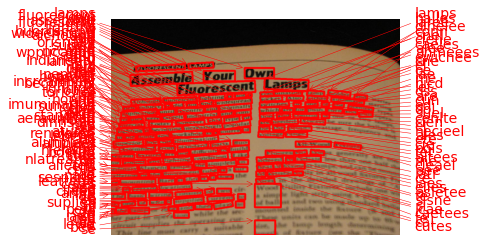

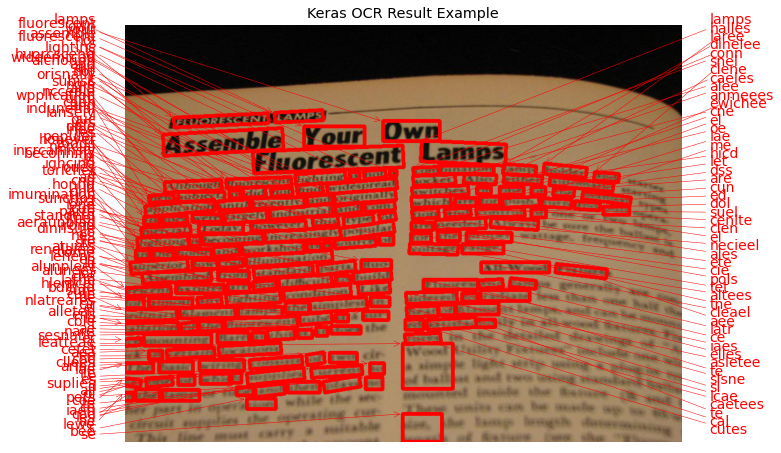

In [5]:
#Using Keras OCR 

import keras_ocr 

pipeline = keras_ocr.pipeline.Pipeline()
results = pipeline.recognize([img_fns[1]])
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[1]), results[0])

pd.DataFrame(results[0], columns=['text', 'bbox'])

fig, ax = plt.subplots(figsize=(10, 10))
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[1]), results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

6/6 [==============================] - 625s 8s/step


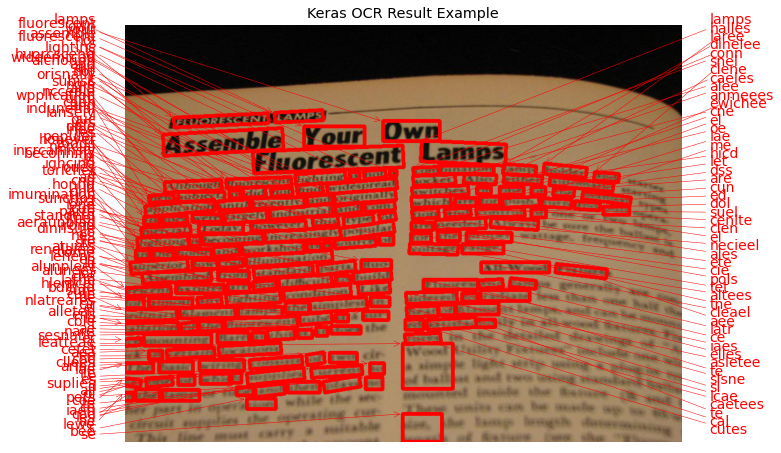

In [6]:
results = pipeline.recognize([img_fns[1]])
pd.DataFrame(results[0], columns=['text', 'bbox'])
fig, ax = plt.subplots(figsize=(10, 10))
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[1]), results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

Looking for /Users/pranuthapunukula/.keras-ocr/craft_mlt_25k.h5
Looking for /Users/pranuthapunukula/.keras-ocr/crnn_kurapan.h5


  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


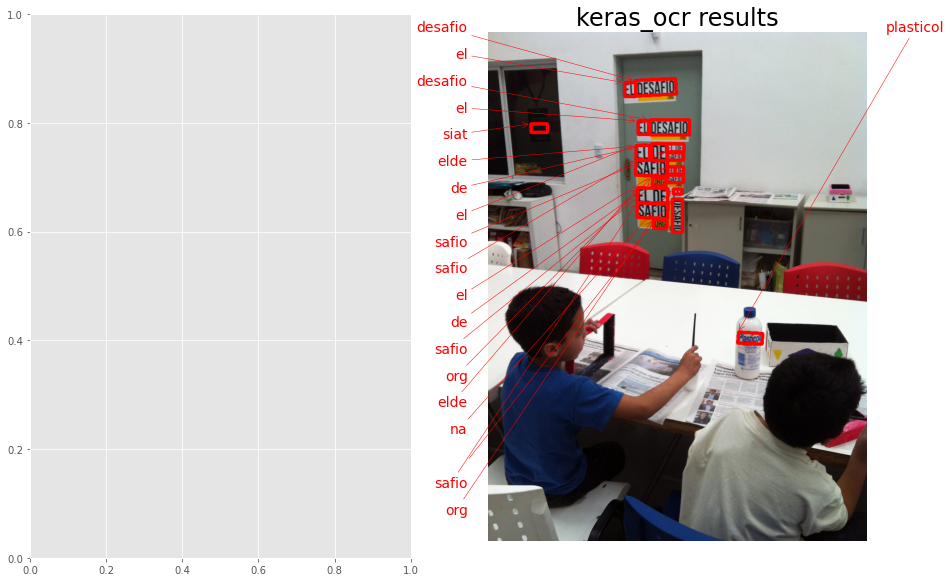

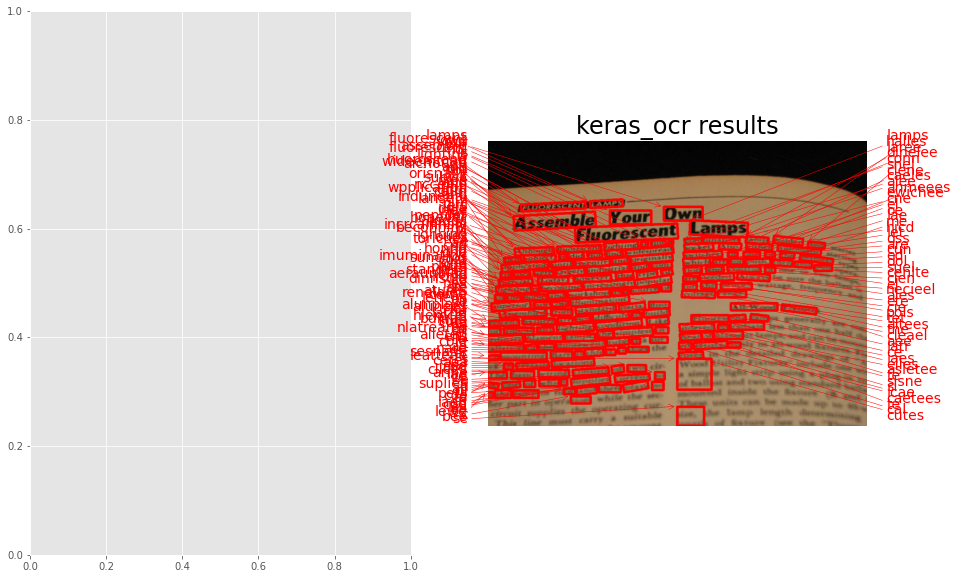

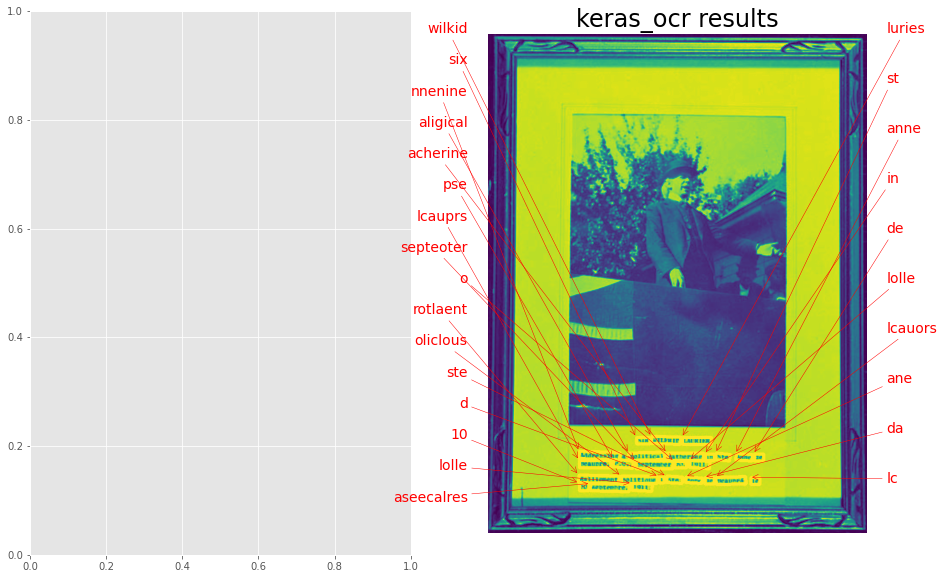

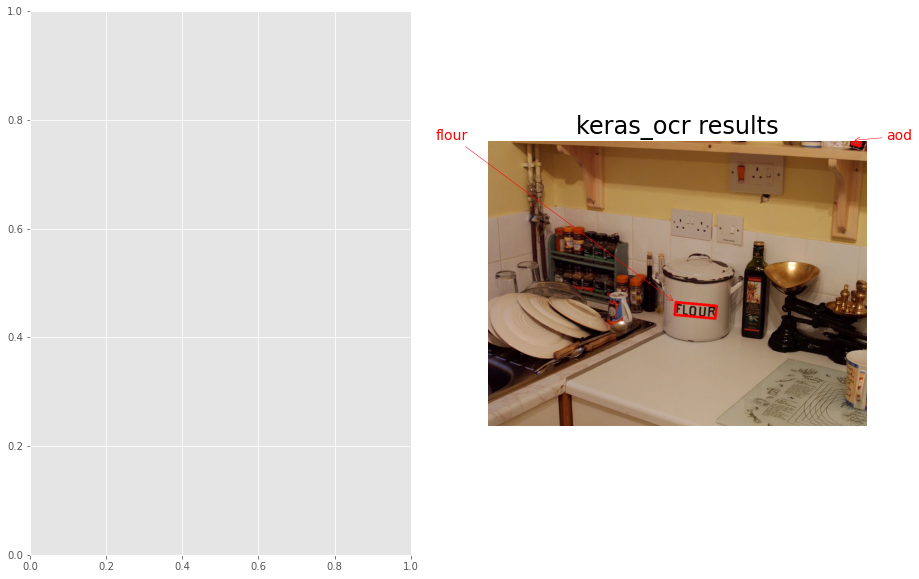

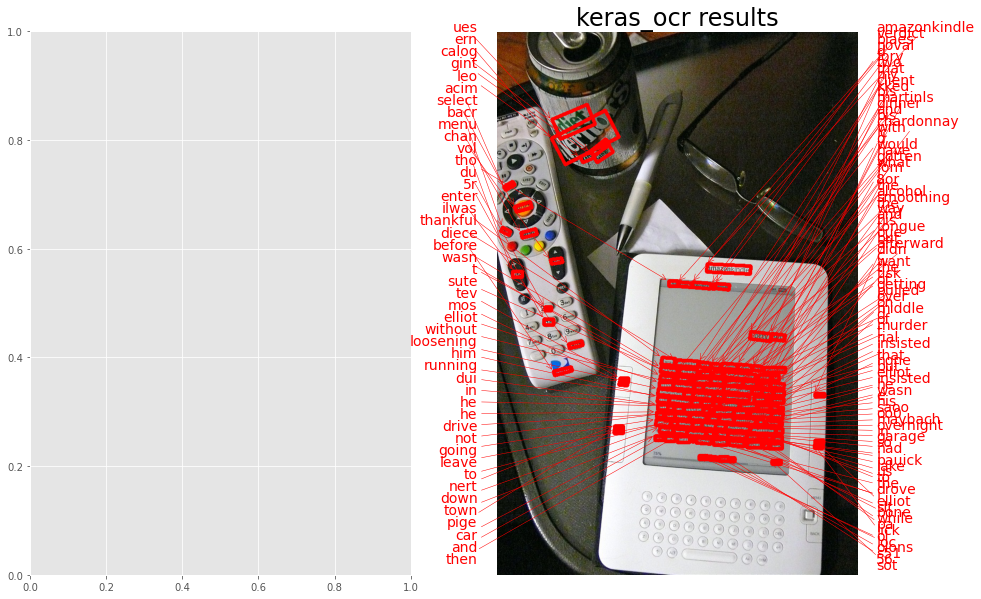

...

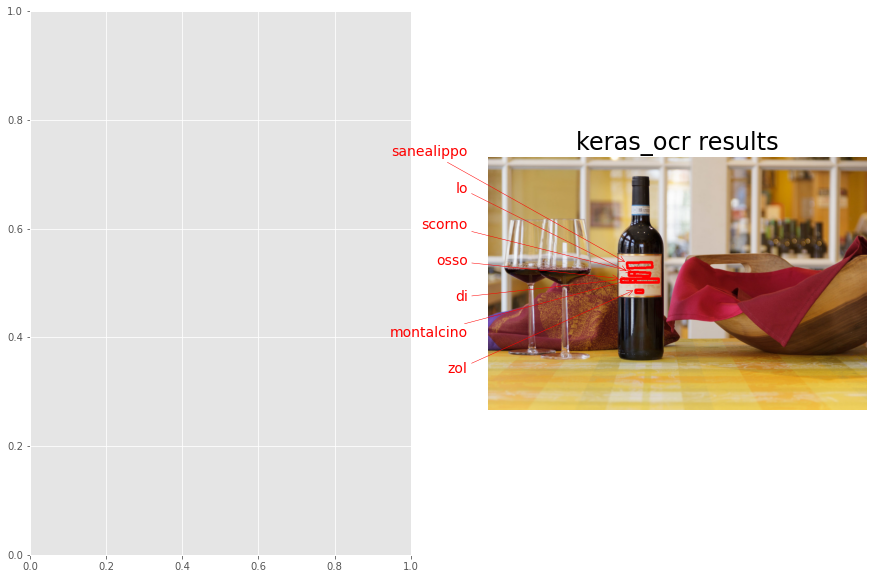

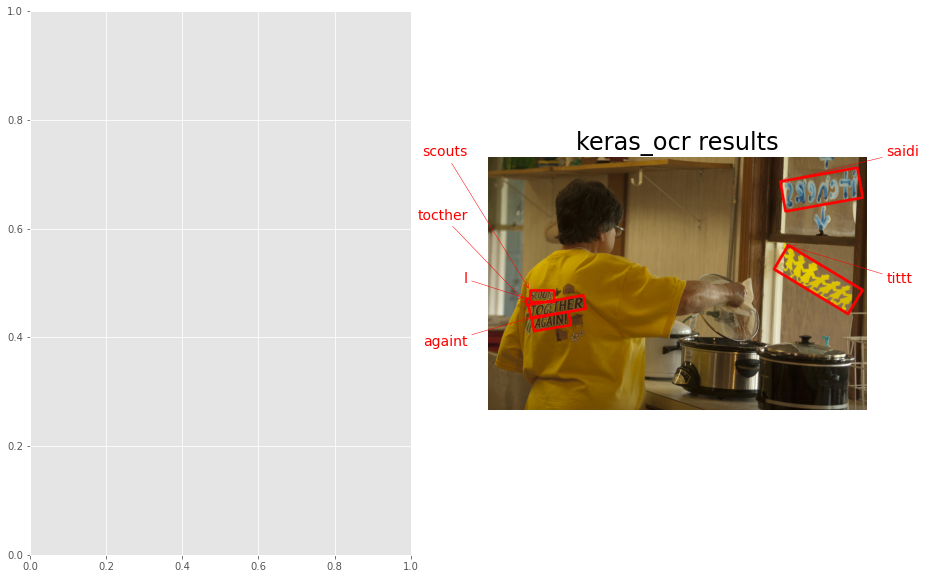

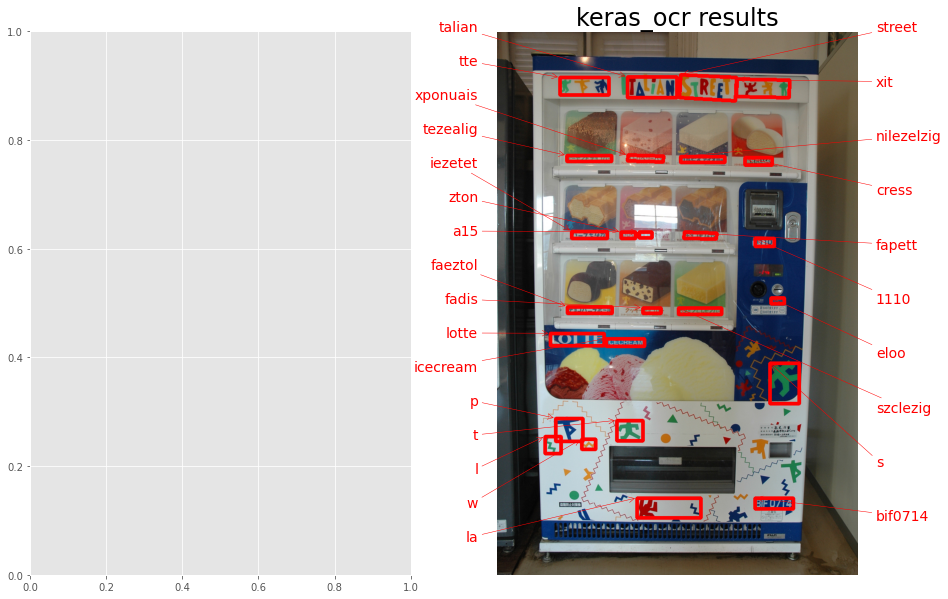

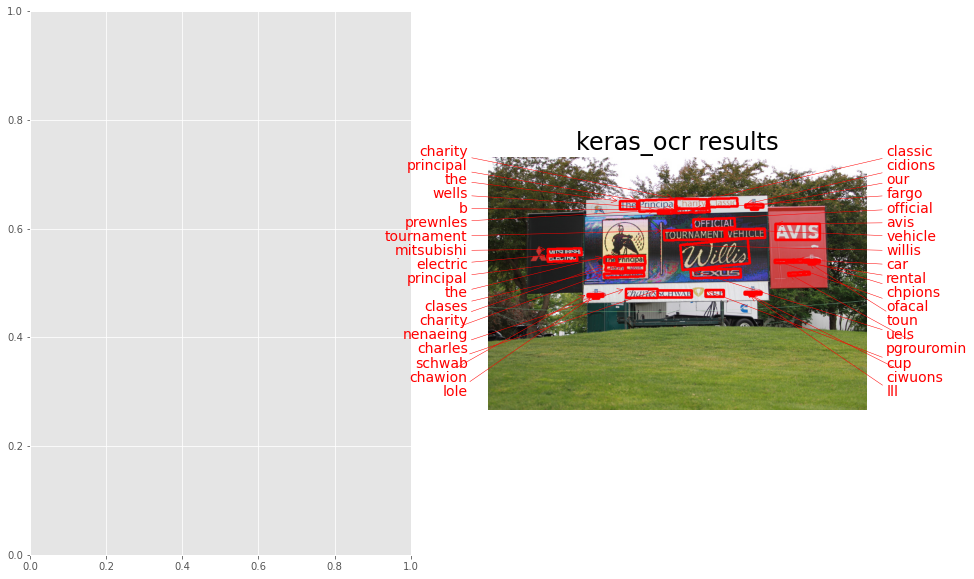

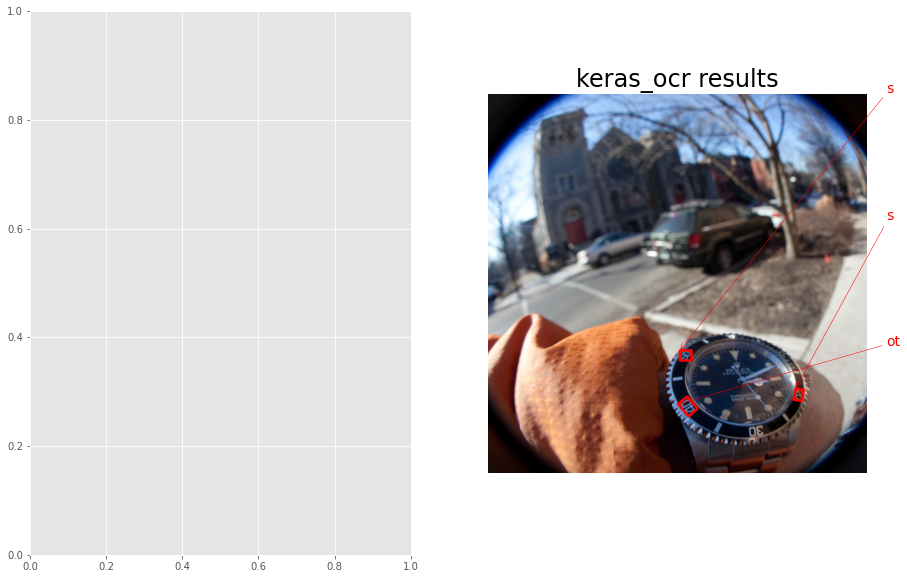

In [7]:
pipeline = keras_ocr.pipeline.Pipeline()

dfs = []
for img in tqdm(img_fns[:25]):
    results = pipeline.recognize([img])
    result = results[0]
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['text', 'bbox'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
kerasocr_df = pd.concat(dfs)


def plot_compare(img_fn, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))
    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    keras_results, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)
    plt.show()

for img_fn in img_fns[:25]:
    plot_compare(img_fn, kerasocr_df)

## Generating Metrics

Get numbers and then improve. How do you get numbers? Here is how. You need to compute character error rate/ word error rate (CER/ WER). Follow this link to get some ideas on computing CER / WER using python: https://towardsdatascience.com/evaluating-ocr-output-quality-with-character-error-rate-cer-and-word-error-rate-wer-853175297510 
- You can downsize the data to build and test your code and then gradually increase your data size, once you have bug-free code. 
- Add more visuals. Especially, feature tables, dataset tables and result tables. 
- Add links to project deliverables - datasets, code GitHub Follow general guidelines at: https://utexas.instructure.com/courses/1352220/assignments/6280920?module_item_id=12784928

In [8]:
kerasocr_df

,text,bbox,img_id
0,desafio,"[[297.89377, 99.32226], [378.67715, 95.3816], ...",00deaa8108d6b4dc
1,el,"[[276.0, 103.0], [298.0, 103.0], [298.0, 131.0...",00deaa8108d6b4dc
2,desafio,"[[327.0, 178.0], [406.0, 178.0], [406.0, 208.0...",00deaa8108d6b4dc
3,el,"[[303.0, 180.0], [324.0, 180.0], [324.0, 207.0...",00deaa8108d6b4dc
4,siat,"[[88.0, 186.0], [121.0, 186.0], [121.0, 203.0]...",00deaa8108d6b4dc
...,...,...,...
34,lll,"[[706.0, 372.0], [718.0, 372.0], [718.0, 376.0...",0c0a22bfd0da315a
35,lole,"[[284.0, 379.0], [301.0, 379.0], [301.0, 383.0...",0c0a22bfd0da315a
0,s,"[[518.0, 694.0], [549.0, 694.0], [549.0, 721.0...",0daeb18df8b52b57
1,s,"[[830.8426, 796.34827], [851.9493, 801.219], [...",0daeb18df8b52b57


In [10]:
from jiwer import wer
from jiwer import cer

actual = "scouts together again!"
predicted = "scouts tocther againt"

error_wer=0
error_cer=0

dfs = []


def compare(img_fn, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))
    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]


for img_fn in img_fns[:25]:
    error_wer= error_wer + wer(img_fn, kerasocr_df)
    error_cer= error_cer + cer(img_fn, kerasocr_df)
    

print(error_wer/25)
print(error_cer/25)

ValueError: input        text                                               bbox  \
0   desafio  [[297.89377, 99.32226], [378.67715, 95.3816], ...   
1        el  [[276.0, 103.0], [298.0, 103.0], [298.0, 131.0...   
2   desafio  [[327.0, 178.0], [406.0, 178.0], [406.0, 208.0...   
3        el  [[303.0, 180.0], [324.0, 180.0], [324.0, 207.0...   
4      siat  [[88.0, 186.0], [121.0, 186.0], [121.0, 203.0]...   
..      ...                                                ...   
34      lll  [[706.0, 372.0], [718.0, 372.0], [718.0, 376.0...   
35     lole  [[284.0, 379.0], [301.0, 379.0], [301.0, 383.0...   
0         s  [[518.0, 694.0], [549.0, 694.0], [549.0, 721.0...   
1         s  [[830.8426, 796.34827], [851.9493, 801.219], [...   
2        ot  [[513.63934, 838.96716], [538.3278, 818.39343]...   

              img_id  
0   00deaa8108d6b4dc  
1   00deaa8108d6b4dc  
2   00deaa8108d6b4dc  
3   00deaa8108d6b4dc  
4   00deaa8108d6b4dc  
..               ...  
34  0c0a22bfd0da315a  
35  0c0a22bfd0da315a  
0   0daeb18df8b52b57  
1   0daeb18df8b52b57  
2   0daeb18df8b52b57  

[712 rows x 3 columns] was expected to be a string or list of strings